In [10]:
library(data.table)
library(glue)
library(Matrix)
library(stringr)
library(dplyr)


Attaching package: ‘data.table’


The following object is masked from ‘package:GenomicRanges’:

    shift


The following object is masked from ‘package:IRanges’:

    shift


The following objects are masked from ‘package:S4Vectors’:

    first, second



Attaching package: ‘glue’


The following object is masked from ‘package:GenomicRanges’:

    trim


The following object is masked from ‘package:IRanges’:

    trim



Attaching package: ‘Matrix’


The following object is masked from ‘package:S4Vectors’:

    expand



Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:Biostrings’:

    collapse, intersect, setdiff, setequal, union


The following object is masked from ‘package:XVector’:

    slice


The following objects are masked from ‘package:GenomicRanges’:

    intersect, setdiff, union


The following object is masked from ‘package:GenomeInfoDb’:

    intersect




In [77]:
devtools::load_all('~/numbat')

ℹ Loading numbat

Warning message:
“replacing previous import ‘Matrix::expand’ by ‘ggtree::expand’ when loading ‘numbat’”


In [2]:
out_dir = glue('/home/tenggao/external/multiome/filtered_feature_bc_matrix')
count_mat = readMM(glue('{out_dir}/matrix.mtx.gz')) %>% as.matrix
cells = fread(glue('{out_dir}/barcodes.tsv.gz'), header = FALSE)$V1
genes = fread(glue('{out_dir}/features.tsv.gz'), header = FALSE)$V2
rownames(count_mat) = genes
colnames(count_mat) = cells

In [5]:
atac_peaks = count_mat %>% rownames %>% str_subset('-') %>% str_subset(':') 
transcripts = rownames(count_mat)[!rownames(count_mat) %in% atac_peaks]
count_mat_tr = count_mat[transcripts,]
count_mat_atac = count_mat[atac_peaks,]

gtf_atac = data.frame(
        peak_id = rownames(count_mat_atac),
        peak = rownames(count_mat_atac)
    ) %>%
    tidyr::separate(
        peak,
        into = c('CHROM', 'region'),
        sep = ':'
    ) %>%
    tidyr::separate(
        region,
        into = c('start', 'end'),
        sep = '-'
    ) %>%
    mutate(CHROM = str_remove(CHROM, 'chr')) %>%
    filter(CHROM %in% 1:22) %>%
    mutate(CHROM = as.integer(CHROM)) %>%
    arrange(CHROM)

In [6]:
df = fread('~/external/multiome/processed/DLBCL_allele_counts.tsv.gz')

In [ ]:
count_mat_bcells = count_mat[transcripts, bcells]

In [17]:
p2 = readRDS('~/external/multiome/p2.rds')

clusters = p2$clusters$PCA$multilevel
# saveRDS(clusters, 'p2_clusters.rds')
bcells = clusters[clusters %in% c(1,12)] %>% names
othercells = clusters[!clusters %in% c(1,12)] %>% names

In [19]:
fwrite(list(bcells), '~/external/multiome/bcell_barcodes.tsv', sep = '\n')

In [20]:
fwrite(list(othercells), '~/external/multiome/other_barcodes.tsv', sep = '\n')

In [ ]:
p2 = pagoda2::basicP2proc(count_mat[genes,], n.cores = 20, min.transcripts.per.cell = 0)

In [191]:
t(as.matrix(p2$misc$rawCounts)) %>% head

,AAACAGCCAGAACCGA-1,AAACAGCCAGCCTAAC-1,AAACAGCCATATTGAC-1,AAACATGCAAATTCGT-1,AAACATGCAACCTAAT-1,AAACATGCAACTAGGG-1,AAACATGCACGAATTT-1,AAACATGCACTAGCGT-1,AAACATGCAGAAATTG-1,AAACATGCAGGAACAT-1,⋯,TTTGTGTTCCTGTTCA-1,TTTGTGTTCCTTCAAT-1,TTTGTGTTCTAACCTT-1,TTTGTGTTCTAAGGAG-1,TTTGTGTTCTTACTCG-1,TTTGTTGGTATGGTGC-1,TTTGTTGGTCAATACG-1,TTTGTTGGTCAGGAAG-1,TTTGTTGGTTCAAGAT-1,TTTGTTGGTTTACTTG-1
MIR1302-2HG,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
FAM138A,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
OR4F5,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AL627309.1,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AL627309.3,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AL627309.2,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


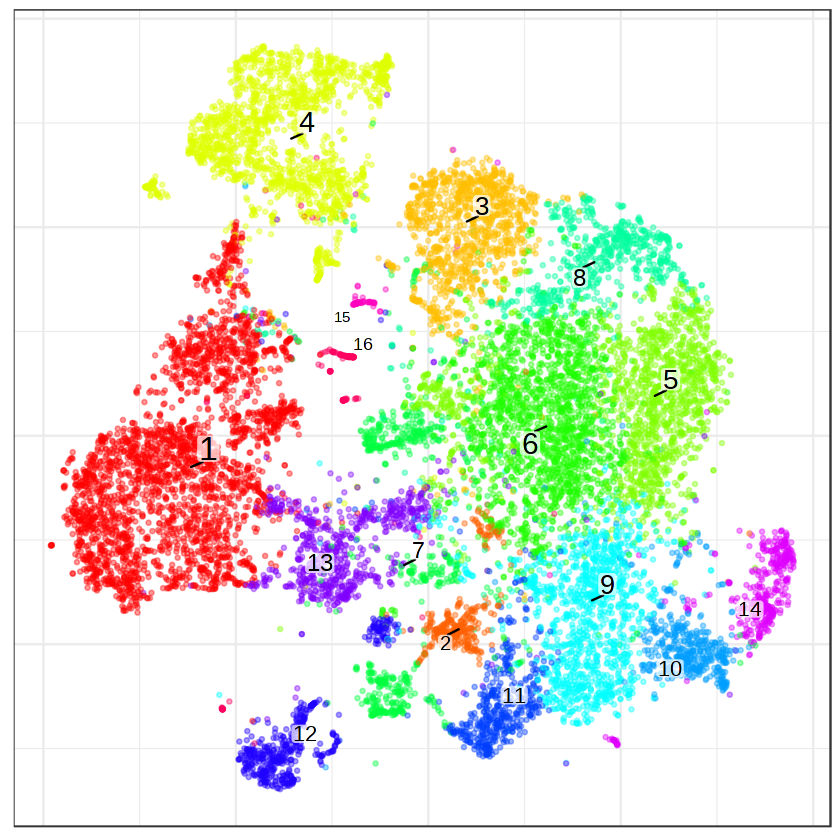

In [164]:
p2$plotEmbedding()

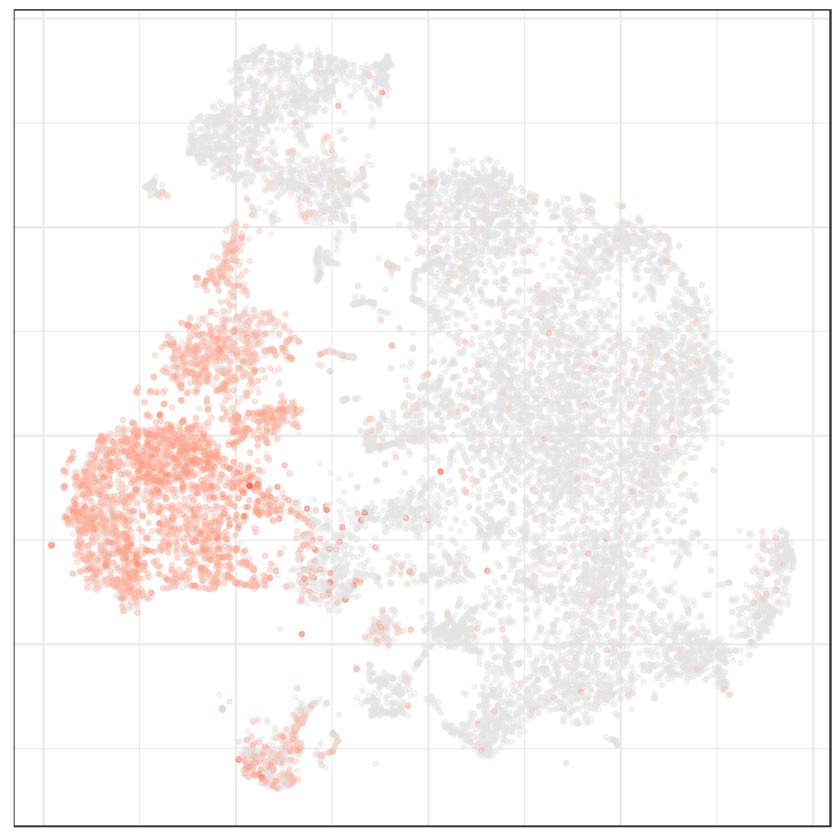

In [165]:
p2$plotEmbedding(gene = 'PAX5')

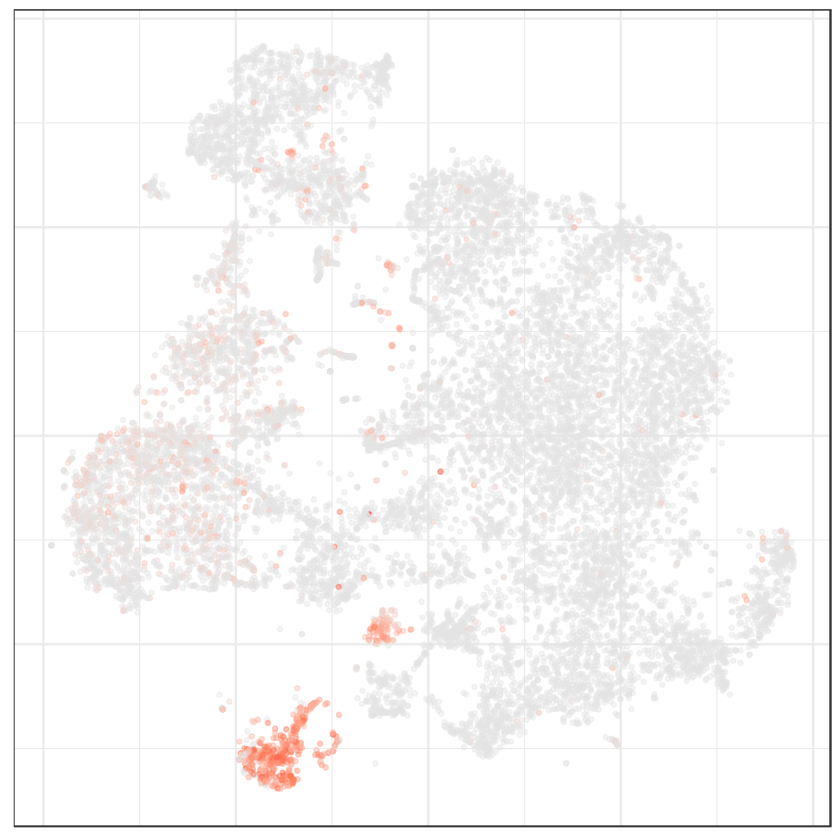

In [168]:
p2$plotEmbedding(gene = 'BANK1')

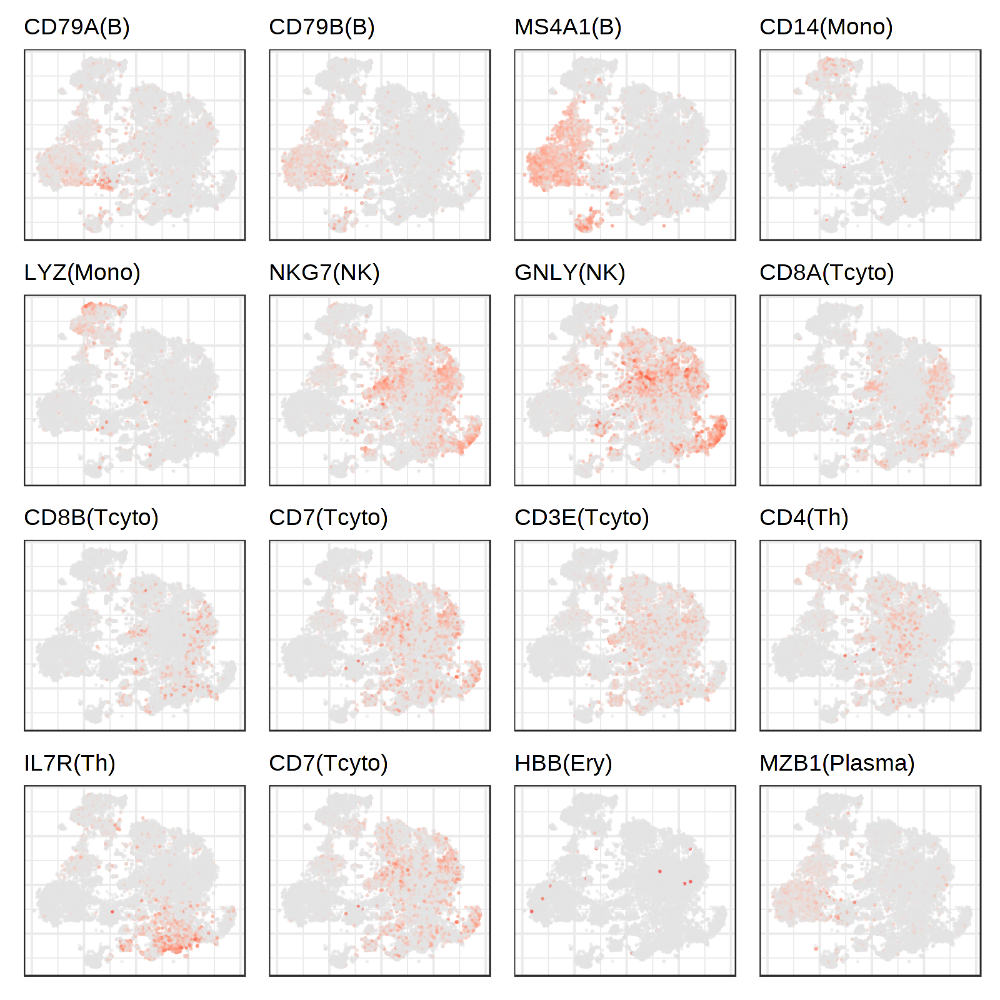

In [297]:
options(repr.plot.width = 8, repr.plot.height = 8, repr.plot.res = 200)

markers = c(
    'CD79A' = 'B', 'CD79B' = 'B', 'MS4A1' = 'B',
    'CD14' = 'Mono', 'LYZ' = 'Mono',
    'NKG7' = 'NK', 'GNLY' = 'NK',
    'CD8A' = 'Tcyto', 'CD8B' = 'Tcyto',
    'CD7' = 'Tcyto', 'CD3E' = 'Tcyto',
    'CD4' = 'Th', 'IL7R' = 'Th', 'CD7' = 'Th',
    'HBB' = 'Ery', 'MZB1' = 'Plasma'
)

lapply(
    names(markers),
    function(gene) {
        p2$plotEmbedding(size=0.1, gene = gene, title = paste0(gene, '(', markers[gene], ')'))}
) %>% 
wrap_plots()

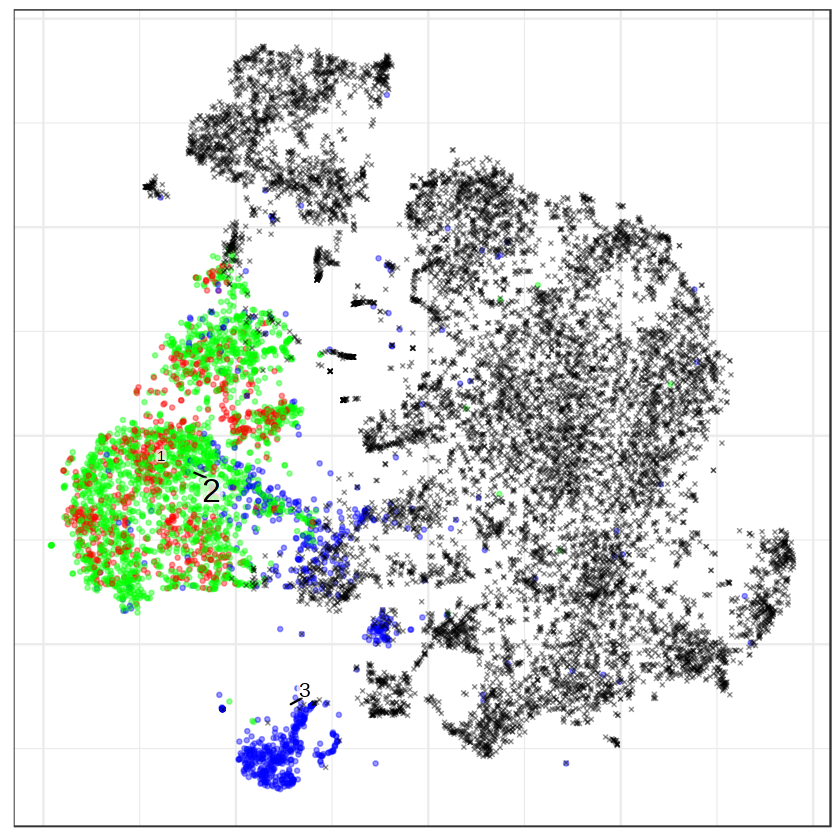

In [167]:
p2$plotEmbedding(
    groups = cutree(clust$hc, k = 3)
)

In [3]:
1

[1] 1

In [162]:
sc_refs = choose_ref_cor(count_mat[,bcells], lambdas_ref[,'B',drop=F], gtf_transcript)

In [305]:
# library(copykat)
# setwd('~/external/multiome')
# genes = unique(rownames(count_mat)[rownames(count_mat) %in% gtf_transcript$gene])
# res = copykat(
#     rawmat=count_mat[genes, bcells], 
#     id.type="S",
#     ngene.chr=0, 
#     win.size=25,
#     KS.cut=0.1, 
#     sam.name="test", 
#     distance="euclidean", 
#     norm.cell.names="", 
#     output.seg="FLASE", 
#     n.cores=30,
#     genome = 'hg20'
# )

In [57]:
count_mat_all = count_mat

In [61]:
hc = hclust(dist_mat, method = "ward.D2")

In [89]:
clust = exp_hclust(
    count_mat[,bcells],
    ref_hca[,c('B', 'Plasma'),drop=F],
    gtf_hg38,
    ncores = 30
)

Fitted reference proportions:

B:1,Plasma:0.0038

number of genes left: 7911

running hclust...



# Numbat

In [544]:
devtools::load_all('~/numbat')

ℹ Loading numbat



In [61]:
nb = Numbat$new(out_dir = '~/numbat_test', i = 2)

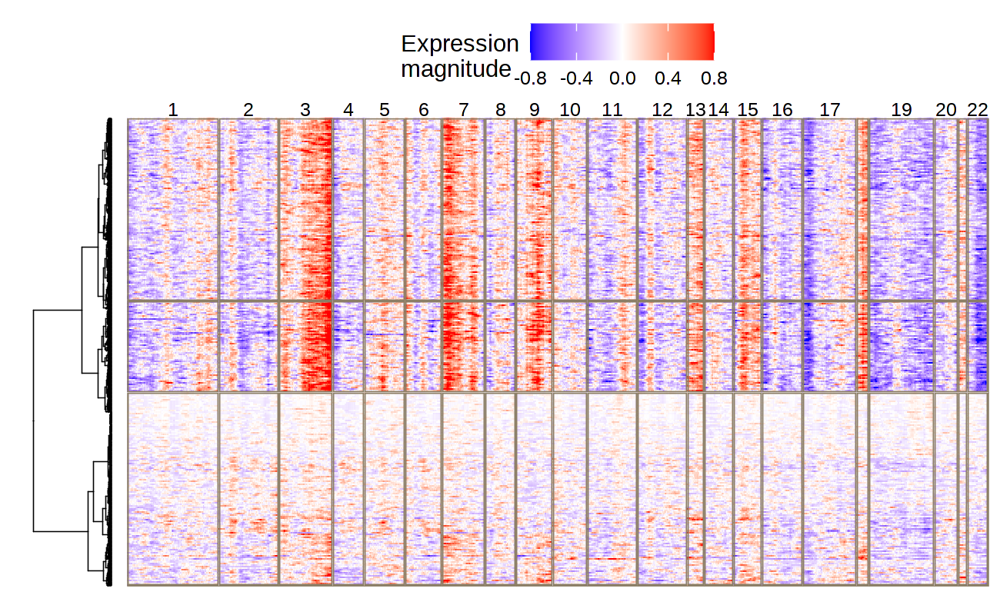

In [404]:
options(repr.plot.width = 6.5, repr.plot.height = 4, repr.plot.res = 200)

nb$plot_exp_roll()

In [71]:
devtools::load_all('~/numbat')

ℹ Loading numbat

Warning message:
“replacing previous import ‘Matrix::expand’ by ‘ggtree::expand’ when loading ‘numbat’”


In [62]:
nb$gtree = annot_superclones(nb$gtree, nb$geno)

In [70]:
score_mut(nb$gtree, nb$geno)

site,node,name,p,TP,FP,precision
<chr>,<int>,<chr>,<dbl>,<int>,<int>,<dbl>
18b,32,Node124,0.8558745,1885,0,1.0000000
3d,32,Node124,0.9669574,2750,0,1.0000000
7a,32,Node124,0.9175556,2608,0,1.0000000
9b,32,Node124,0.8199489,1242,0,1.0000000
9d,32,Node124,0.8997285,2230,0,1.0000000
3c,43,Node52,0.8448216,1933,22,0.9887468
15c,43,Node52,0.7970123,1523,29,0.9813144
3b,43,Node52,0.8228717,1769,47,0.9741189
17a,43,Node52,0.7687644,1220,35,0.9721116


In [66]:
score_mut(nb$gtree, nb$geno)

site,node,name,p,TP,FP,precision
<chr>,<int>,<chr>,<dbl>,<int>,<int>,<dbl>
18b,32,Node124,0.7964805,1885,4,0.9978825
9d,32,Node124,0.8314285,2230,9,0.9959803
3d,32,Node124,0.8739652,2750,16,0.9942155
7a,32,Node124,0.8728439,2608,16,0.9939024
9b,32,Node124,0.7394702,1242,8,0.9936000
3c,43,Node52,0.8276446,1933,26,0.9867279
15c,43,Node52,0.7699496,1523,39,0.9750320
3b,43,Node52,0.7987030,1769,52,0.9714443
17a,43,Node52,0.7338800,1220,36,0.9713376


Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


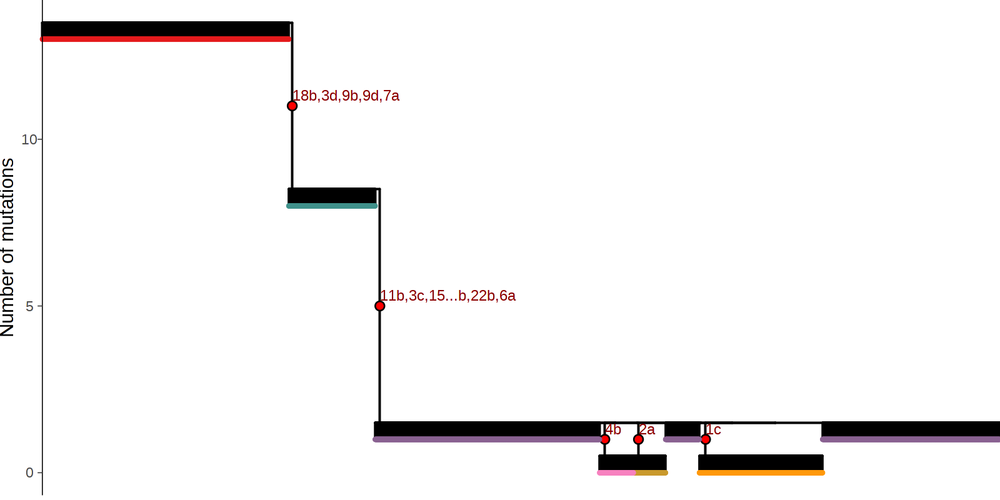

In [68]:
nb$gtree %>% plot_sc_tree()

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


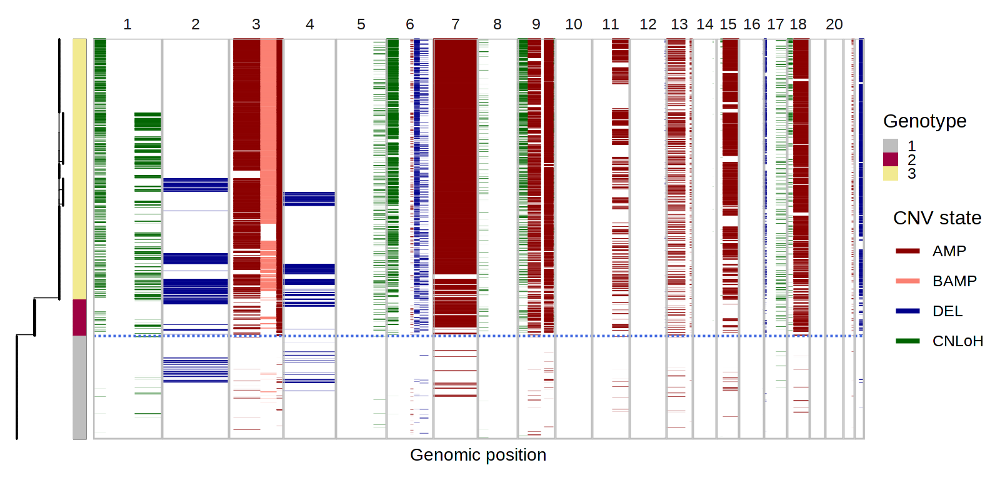

In [65]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 200)

plot_phylo_heatmap(
    nb$gtree, 
    nb$joint_post,
    nb$segs_consensus,
#     annot = cell_annot %>% {setNames(.$cell_type , .$cell)},
    geno_bar = T,
    superclone = T
)

In [525]:
bulks = nb$bulk_clones %>% annot_consensus(nb$segs_consensus)

In [528]:
bulks2 = bulks %>% run_group_hmms(run_hmm = F)

In [545]:
bulk = bulks %>%
    filter(sample == 3) %>%
    analyze_bulk(
        find_diploid = FALSE, 
        run_hmm = FALSE,
        allele_only = FALSE, 
        diploid_chroms = NULL,
        retest = TRUE, 
        verbose = TRUE
    )

Retesting CNVs..

Finishing..



In [547]:
bulk %>% filter(CHROM == 7) %>% distinct(LLR, seg)

seg,LLR
<fct>,<dbl>
7a,1065.752


In [531]:
bulks2 %>% filter(CHROM == 7) %>% distinct(LLR, LLR_x, LLR_y, seg)

seg,LLR_x,LLR_y,LLR
<fct>,<dbl>,<dbl>,<dbl>
7a,NA,NA,NA


Warning message:
“Removed 21 rows containing missing values (geom_segment).”


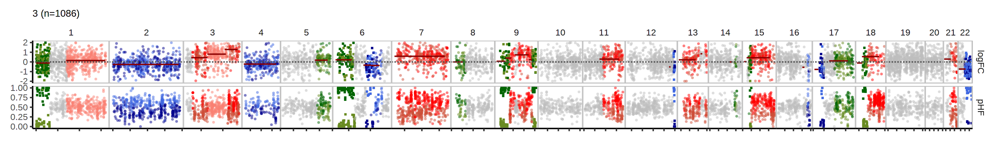

In [604]:
options(repr.plot.width = 14, repr.plot.height = 2, repr.plot.res = 200)

bulk %>%
plot_bulks(min_depth = 15)

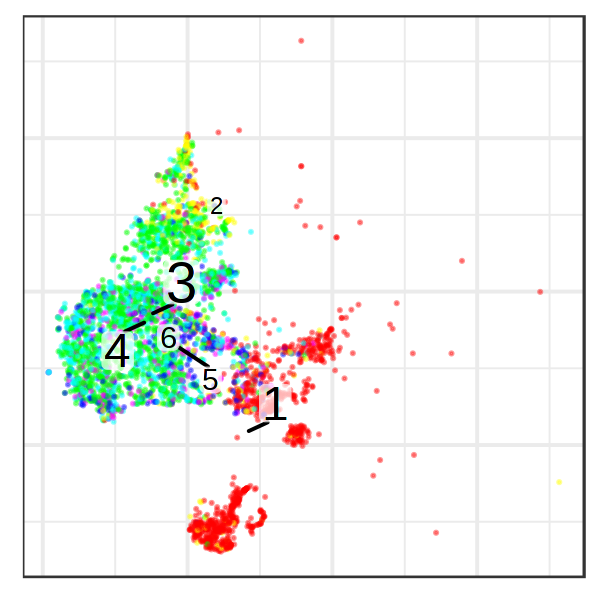

In [614]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 200)

p2$plotEmbedding(
    groups = nb$clone_post %>% {setNames(.$clone_opt, .$cell)},
    size = 0.1,
    plot.na = F
)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



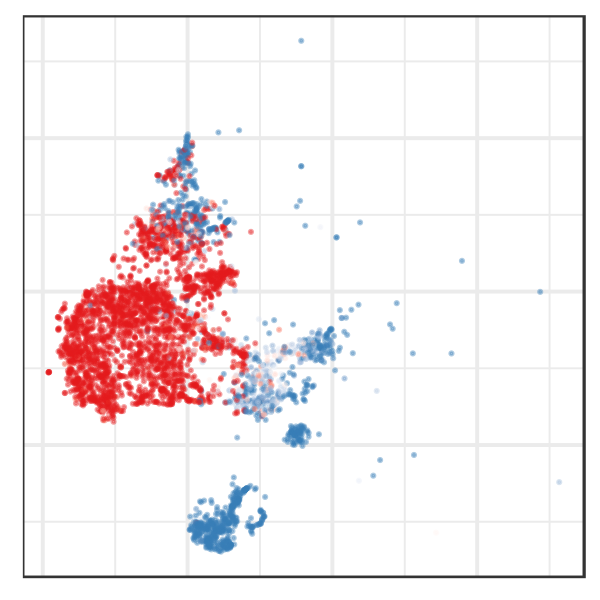

In [553]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 200)

p2$plotEmbedding(
    colors = nb$joint_post %>% group_by(cell) %>% summarise(logBF = sum(logBF)) %>% {setNames(.$logBF, .$cell)},
    size = 0.1,
    plot.na = F
) +
scale_color_gradient2(low = pal[2], high = pal[1], midpoint = 0, limits = c(-10,10), oob = scales::oob_squish)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



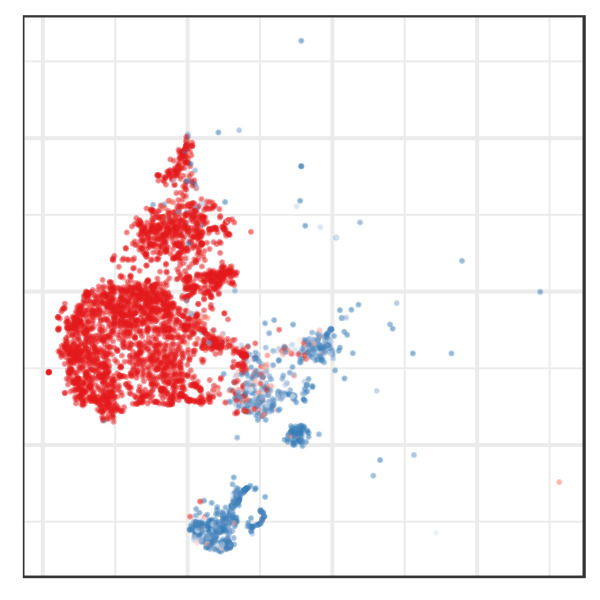

In [513]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 200)

p2$plotEmbedding(
    colors = nb$clone_post %>% {setNames(.$p_cnv, .$cell)},
    size = 0.1,
    plot.na = F
) +
scale_color_gradient2(low = pal[2], high = pal[1], midpoint = 0.5, limits = c(0,1), oob = scales::oob_squish)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



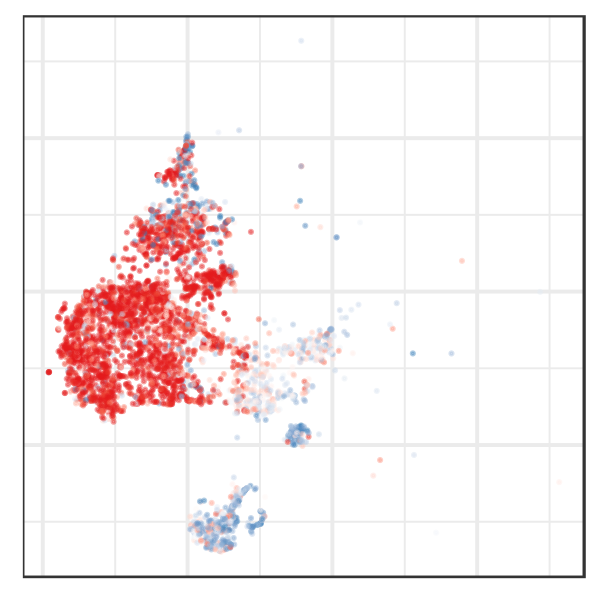

In [514]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 200)

p2$plotEmbedding(
    colors = nb$clone_post %>% {setNames(.$p_cnv_y, .$cell)},
    size = 0.1,
    plot.na = F
) +
scale_color_gradient2(low = pal[2], high = pal[1], midpoint = 0.5, limits = c(0,1), oob = scales::oob_squish)

In [438]:
ref_internal %>% saveRDS('~/external/multiome/ref_clusters.rds')

In [164]:
cell_annot = data.frame(cell = names(clusters), cell_type = clusters)
ref_internal = aggregate_counts(count_mat = count_mat_tr, cell_annot)$exp_mat

cell_dict
   1    2    3    4    5    6    7    8    9   10   11   12   13   14   15   16 
2916  313 1104 1719 1429 1795  659  684 1241  469  485  504  714  399   64  150 


In [419]:
devtools::load_all('~/numbat')

ℹ Loading numbat



In [420]:
cluster = 9

cells = cell_annot %>% filter(cell_type == cluster) %>% pull(cell)

bulk = get_bulk(
    count_mat = count_mat_tr[,cells],
    lambdas_ref = ref_internal[,colnames(ref_internal) != cluster],
    df_allele = df %>% filter(cell %in% cells),
    gtf_transcript = gtf_hg38,
    genetic_map = genetic_map_hg38
)

Fitted reference proportions:

2:0.00081,3:0.0032,4:0.00081,5:0.034,6:0.88,7:0.0056,8:0.00081,10:0.028,11:0.042,14:0,15:0.00081,16:0

number of genes left: 11320



In [429]:
bulk = bulk %>% analyze_bulk(retest = T)

Retesting CNVs..

Finishing..



In [426]:
segs = bulk %>% 
            distinct(CHROM, seg, seg_start, seg_start_index, seg_end, seg_end_index, phi_mle, cnv_state) %>%
            mutate(variable = 'logFC')

In [389]:
segs_post = retest_cnv(bulk, gamma = gamma, exp_model = 'lnpois', allele_only = F)

Warning message:
“attributes are not identical across measure variables; they will be dropped”
Warning message:
“Using alpha for a discrete variable is not advised.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


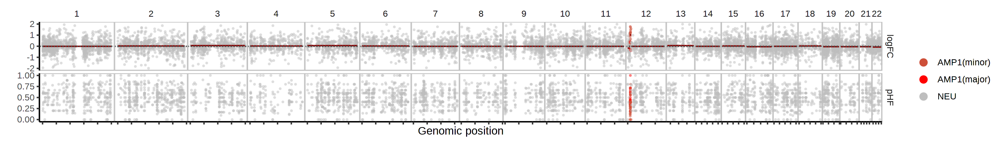

In [434]:
options(repr.plot.width = 14, repr.plot.height = 2, repr.plot.res = 200)

bulk %>% plot_psbulk(min_depth = 5, min_LLR = 0, use_pos = T)

In [167]:
cells = cell_annot %>% filter(cell_type == 1) %>% pull(cell)

bulk_tumor = get_bulk(
    count_mat = count_mat_tr[,cells],
    lambdas_ref = ref_internal[,'12',drop=F],
    df_allele = df %>% filter(cell %in% cells),
    gtf = gtf_hg38,
    genetic_map = genetic_map_hg38
)

number of genes left: 11222



In [176]:
R.utils::sourceDirectory('~/Numbat/R')

bulk_tumor = bulk_tumor %>% analyze_bulk()

Retesting CNVs..

Finishing..



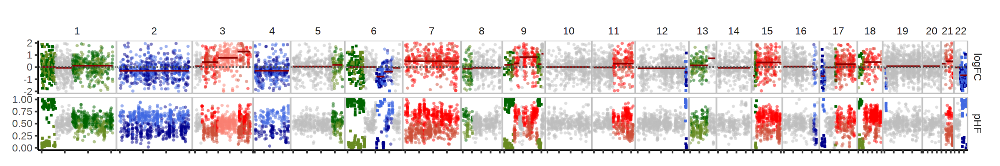

In [177]:
options(repr.plot.width = 12, repr.plot.height = 2, repr.plot.res = 200)

bulk_tumor %>% plot_bulks(min_depth = 25, min_LLR = 50, use_pos = F)

# ATAC

In [82]:
ref_atac = aggregate_counts(
    count_mat_atac,
    data.frame(
        cell = colnames(count_mat_atac)
    ) %>%
    mutate(cell_type = ifelse(cell %in% bcells, 'B', 'other'))
)

cell_dict
    B other 
 3420 11225 


In [83]:
normal_bcells = names(clusters[clusters == 12])

ref_bcells = aggregate_counts(
    count_mat_atac,
    data.frame(
        cell = colnames(count_mat_atac)
    ) %>%
    filter(cell %in% normal_bcells) %>%
    mutate(cell_type = "B")
)$exp_mat

cell_dict
  B 
504 


In [631]:
clust_atac = exp_hclust(
    count_mat = count_mat_atac[,bcells[!bcells %in% normal_bcells]],
    lambdas_ref = ref_bcells,
    gtf_transcript = gtf_atac %>% rename(gene = peak_id, gene_start = start, gene_end = end),
    ncores = 30,
    window = 201
)

Fitted reference proportions:

B:1

number of genes left: 37142

running hclust...



In [ ]:
gtf_atac = gtf_atac %>% 
    left_join(chrom_sizes, by = 'CHROM') %>%
    mutate(start = as.integer(start))

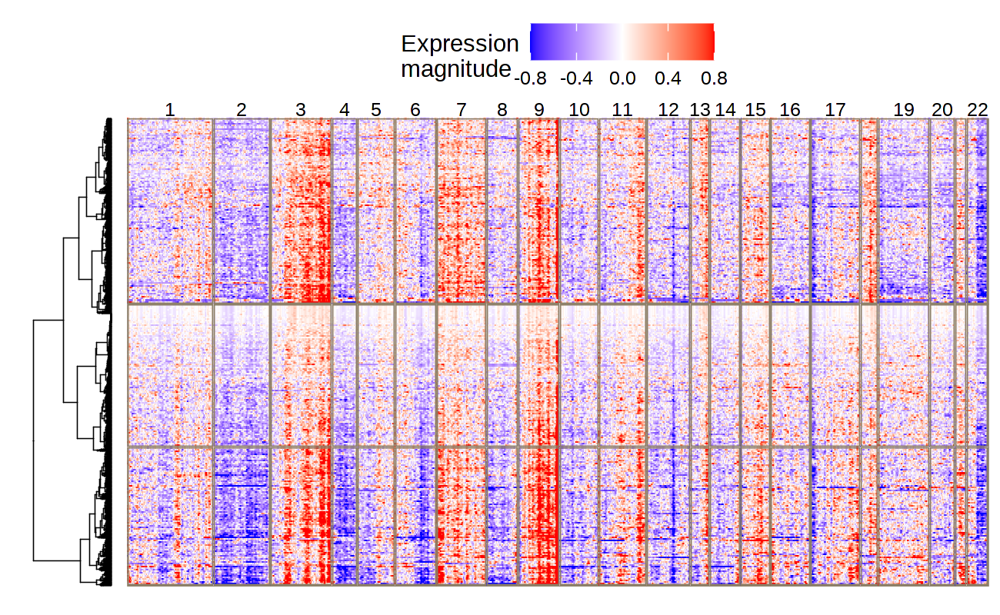

In [632]:
options(repr.plot.width = 6.5, repr.plot.height = 4, repr.plot.res = 200)

plot_sc_roll(
    gexp_roll_wide = clust_atac$gexp_roll_wide %>% as.data.frame() %>% tibble::rownames_to_column('cell'),
    hc = clust_atac$hc,
    gtf_transcript = gtf_atac %>% rename(gene = peak_id, gene_start = start, gene_end = end),
    k = 3,
    n_sample = 300
)

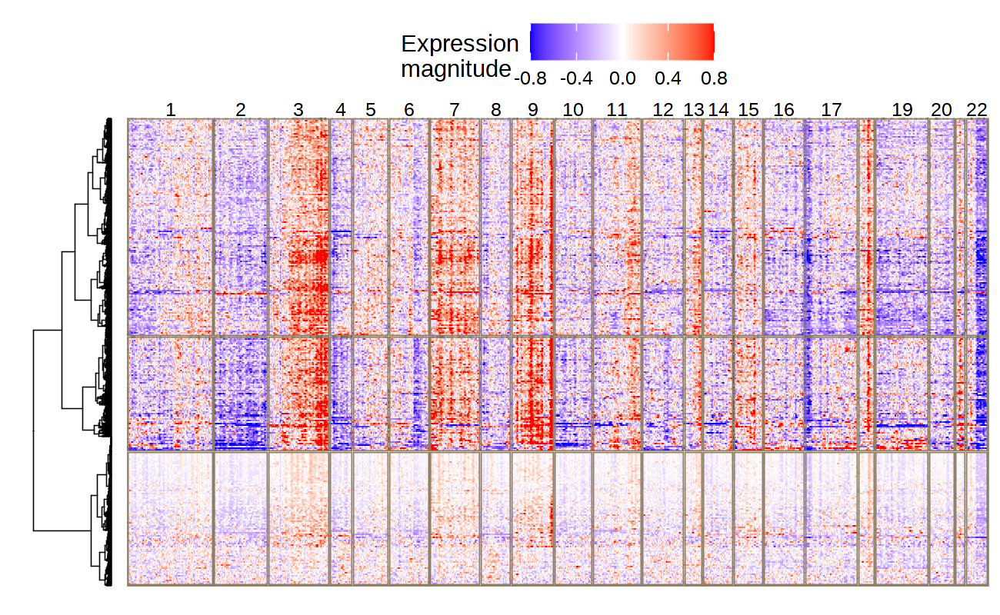

In [603]:
options(repr.plot.width = 6.5, repr.plot.height = 4, repr.plot.res = 200)

plot_sc_roll(
    gexp_roll_wide = clust_atac$gexp_roll_wide %>% as.data.frame() %>% tibble::rownames_to_column('cell'),
    hc = clust_atac$hc,
    gtf_transcript = gtf_atac %>% rename(gene = peak_id, gene_start = start, gene_end = end),
    k = 3,
    n_sample = 300
)

In [159]:
process_exp_sc = function(count_mat, lambdas_ref, gtf_transcript, window = 101, verbose = T) {

    mut_expressed = filter_genes(count_mat, lambdas_ref, gtf_transcript, verbose = verbose)
    count_mat = count_mat[mut_expressed,,drop=FALSE]
    lambdas_ref = lambdas_ref[mut_expressed]
        
    exp_mat = scale(count_mat, center=FALSE, scale=colSums(count_mat))

    exp_mat_norm = log2(exp_mat * 1e6 + 1) - log2(lambdas_ref * 1e6 + 1)

    # capping 
    cap = 3
    exp_mat_norm[exp_mat_norm > cap] = cap
    exp_mat_norm[exp_mat_norm < -cap] = -cap

    # centering by cell
    row_mean = apply(exp_mat_norm, 2, function(x) { mean(x, na.rm=TRUE) } )
    exp_mat_norm = t(apply(exp_mat_norm, 1, "-", row_mean))
    
    gexp.norm = exp_mat_norm %>% as.data.frame() %>%
        tibble::rownames_to_column('gene') %>%
        inner_join(
            gtf_transcript %>% select(gene, CHROM, gene_start, gene_end),
            by = "gene"
        ) %>%
        filter(!(CHROM == 6 & gene_start < 33480577 & gene_end > 28510120)) %>%
        mutate(gene = droplevels(factor(gene, gtf_transcript$gene))) %>%
        mutate(gene_index = as.integer(gene)) %>% 
        mutate(CHROM = as.integer(CHROM)) %>%
        arrange(CHROM, gene)

    gexp.norm.long = gexp.norm %>% 
        reshape2::melt(
            id.var = c('CHROM', 'gene', 'gene_index', 'gene_start', 'gene_end'),
            variable.name = 'cell',
            value.name = 'exp')    

    gexp.norm.long = gexp.norm.long %>% 
        group_by(cell, CHROM) %>%
        mutate(exp_rollmean = caTools::runmean(exp, k = window, align = "center")) %>%
        ungroup()
    
    return(gexp.norm.long)
}


In [160]:
R.utils::sourceDirectory('~/Numbat/R')

gexp_norm_long = process_exp_sc(
    count_mat = count_mat_atac[,bcells[!bcells %in% normal_bcells]],
    lambdas_ref = ref_bcells[,'B'],
    gtf_transcript = gtf_atac %>% rename(gene = peak_id, gene_start = start, gene_end = end),
    window = 201,
    verbose = T
)

number of genes left: 36963



In [86]:
chrom_sizes = fread('~/ref/hg38.chrom.sizes.txt') %>% setNames(c('CHROM', 'length')) %>%
    mutate(CHROM = str_remove(CHROM, 'chr')) %>%
    filter(CHROM %in% 1:22) %>%
    mutate(CHROM = as.integer(CHROM))

In [151]:
bin_size = 1e6

gtf_atac = gtf_atac %>% 
    group_by(CHROM) %>%
    mutate(
        bin = cut(start, seq(1, unique(length) + bin_size, bin_size)),
        bin_index = as.integer(as.factor(bin))
    )

ref_cov = count_mat_atac[,normal_bcells] %>% 
    rowSums %>%
    as.data.frame() %>%
    tibble::rownames_to_column('peak_id') %>%
    setNames(c('peak_id', 'count')) %>%
    inner_join(gtf_atac, by = "peak_id") %>%
    group_by(CHROM, bin_index) %>%
    summarise(
        count = sum(count),
        .groups = 'drop'
    ) %>%
    mutate(cov = count/sum(count))

obs_cov = count_mat_atac[,bcells[!bcells %in% normal_bcells]] %>% 
    rowSums %>%
    as.data.frame() %>%
    tibble::rownames_to_column('peak_id') %>%
    setNames(c('peak_id', 'count')) %>%
    inner_join(gtf_atac, by = "peak_id") %>%
    group_by(CHROM, bin_index) %>%
    summarise(
        count = sum(count),
        .groups = 'drop'
    ) %>%
    mutate(cov = count/sum(count))

Warning message:
“Removed 1 rows containing missing values (geom_point).”


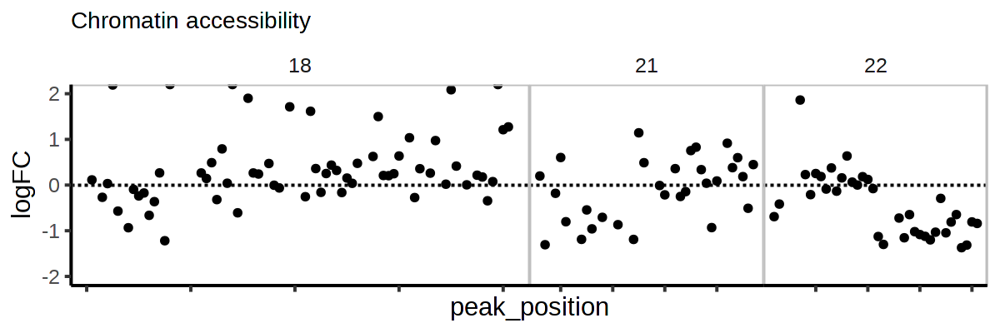

In [153]:
options(repr.plot.width = 6, repr.plot.height = 2, repr.plot.res = 200)

chroms = c(18, 21, 22)

obs_cov %>% 
left_join(
    ref_cov,
    by = c('CHROM', 'bin_index')
) %>% 
mutate(logFC = log2(cov.x/cov.y)) %>%
filter(CHROM %in% chroms) %>%
ggplot(
    aes(x = bin_index, y = logFC)
) +
geom_point(size = 1) +
theme_classic() +
theme(
    panel.spacing.x = unit(0, 'mm'),
    panel.spacing.y = unit(1, 'mm'),
    panel.border = element_rect(size = 0.5, color = 'gray', fill = NA),
    strip.background = element_blank(),
    axis.text.x = element_blank(),
    plot.title = element_text(size = 10)
) +
facet_grid(~CHROM, scale = 'free', space = 'free_x') +
ylab('logFC') +
coord_cartesian(ylim = c(-2,2)) +
geom_hline(yintercept = 0, linetype = 'dashed') +
xlab('peak_position') +
ggtitle('Chromatin accessibility')

In [245]:
library(ggpubr)

Loading required package: ggplot2


Attaching package: ‘ggpubr’


The following object is masked from ‘package:numbat’:

    rotate




In [274]:
set.seed(0)

chroms = c(21, 22)

D = gexp_norm_long %>%
    filter(cell %in% sample(unique(cell), 100)) %>%
#     filter(CHROM %in% chroms) %>%
    mutate(gene_start = as.integer(gene_start))

`summarise()` has grouped output by 'cnv_state_post'. You can override using the `.groups` argument.


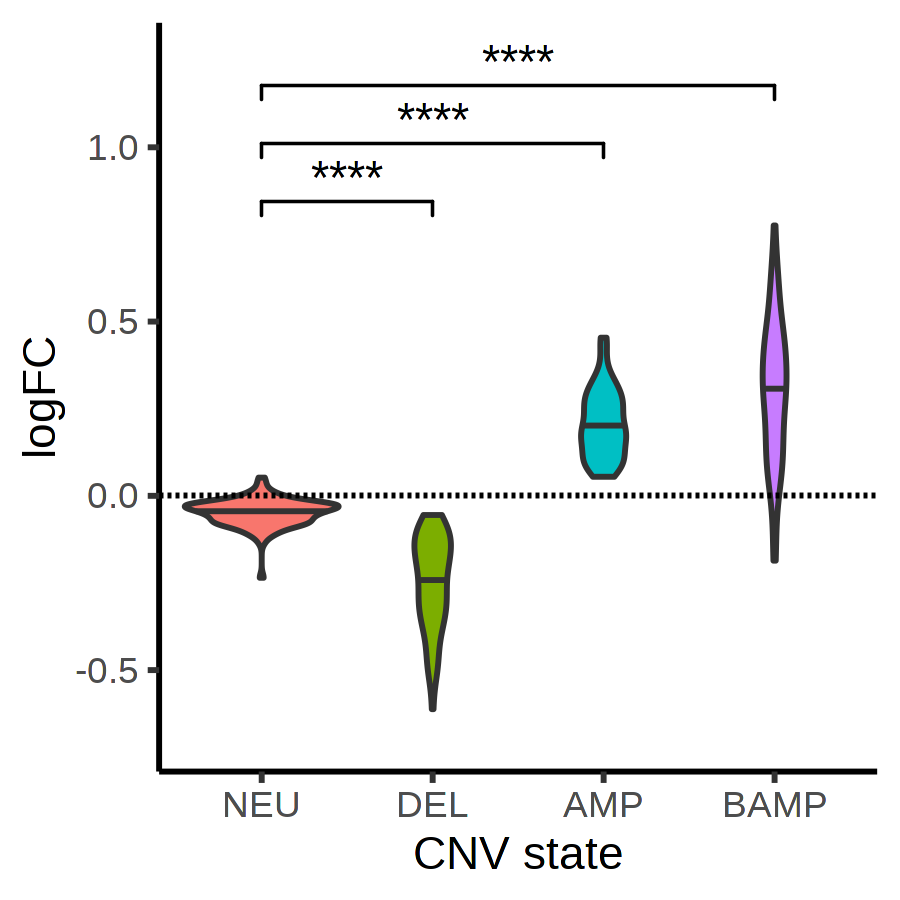

In [291]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 300)

segs_consensus = get_segs_consensus(bulk_tumor) 

D %>%  
mutate(POS = gene_start, snp_id = gene) %>%
annot_consensus(segs_consensus) %>%
# mutate(cnv_state_post = ifelse(cnv_state_post %in% c('loh', 'neu'), 'NEU/LOH', cnv_state_post)) %>%
filter(cnv_state_post != 'loh') %>%
group_by(cnv_state_post, cell) %>%
summarise(
    logFC = mean(exp)
) %>%
mutate(cnv_state_post = str_to_upper(cnv_state_post)) %>%
mutate(cnv_state_post = factor(cnv_state_post, c('NEU', 'DEL', 'AMP', 'BAMP'))) %>%
ggplot(
    aes(x = cnv_state_post, y = logFC, fill = cnv_state_post)
) +
theme_classic() +
geom_violin(draw_quantiles = c(0.5)) +
geom_hline(yintercept = 0, linetype = 'dashed') +
stat_compare_means(comparisons = list(c('NEU', 'DEL'), c('NEU', 'AMP'), c('NEU', 'BAMP')), label = 'p.signif') +
xlab('CNV state') +
scale_y_continuous(expand = expansion(0.1)) +
# coord_cartesian(ylim = c(-1,1)) +
guides(fill = 'none')

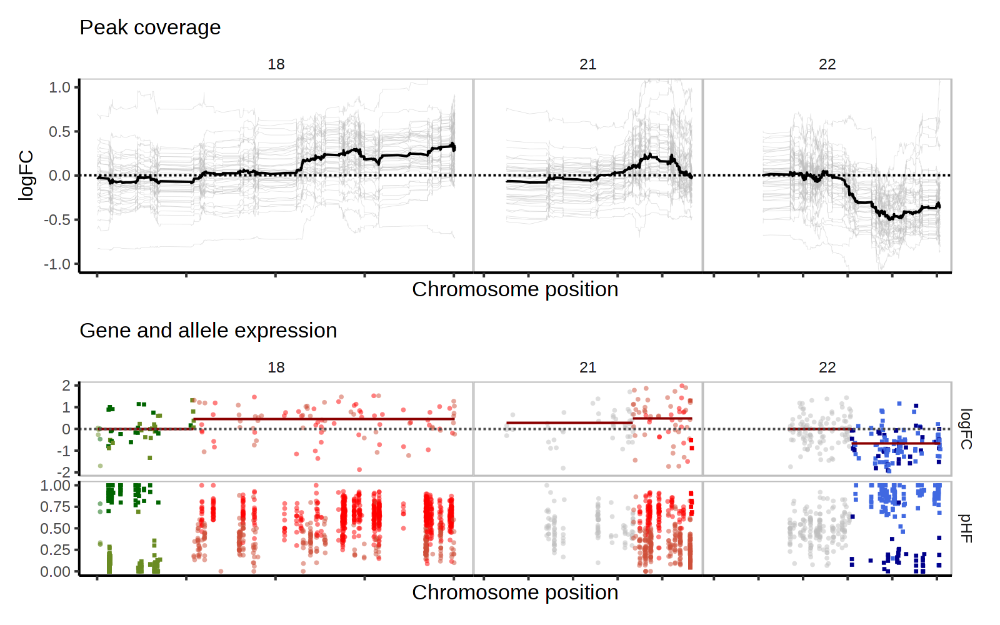

In [187]:
options(repr.plot.width = 8, repr.plot.height = 5, repr.plot.res = 200)

p1 = D %>%
    ggplot(
        aes(x = gene_start, y = exp_rollmean, group = cell)
    ) +
    geom_line(color = 'gray', alpha = 0.5, size = 0.1) +
    geom_line(
        data = D %>% group_by(CHROM, gene, gene_start) %>%
            summarise(
                exp_rollmean = median(exp_rollmean),
                .groups = 'drop'
            ) %>%
            mutate(cell = 'avg')
    ) +
    geom_segment(
        inherit.aes = F,
        data = chrom_sizes %>% filter(CHROM %in% D$CHROM),
        aes(x = 0, xend = length, y = 0, yend = 0),
        alpha = 0
    ) +
    theme_classic() +
    theme(
        panel.spacing.x = unit(0, 'mm'),
        panel.spacing.y = unit(1, 'mm'),
        panel.border = element_rect(size = 0.5, color = 'gray', fill = NA),
        strip.background = element_blank(),
        axis.text.x = element_blank(),
        plot.title = element_text(size = 12)
    ) +
    facet_grid(~CHROM, scale = 'free', space = 'free_x') +
    ylab('logFC') +
    coord_cartesian(ylim = c(-1,1)) +
    geom_hline(yintercept = 0, linetype = 'dashed') +
    xlab('Chromosome position') +
    ggtitle('Peak coverage') +
    theme(axis.title.x = element_text(size = 12))

p2 = bulk_tumor %>%
    filter(CHROM %in% chroms) %>%
    mutate(CHROM = as.integer(CHROM)) %>%
    plot_bulks(min_depth = 10, use_pos = T) +
    geom_segment(
        inherit.aes = F,
        data = chrom_sizes %>% filter(CHROM %in% D$CHROM),
        aes(x = 0, xend = length, y = 0, yend = 0),
        alpha = 0
    ) +
    ggtitle('Gene and allele expression') +
    xlab('Chromosome position') +
    theme(
        axis.title.x = element_text(size = 12),
        plot.title = element_text(size = 12)
    )

p1/p2

In [21]:
library(DESeq2)
dds = readRDS('~/PQE/mdamb231_rna_dds')

Loading required package: S4Vectors

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply

In [22]:
# Quality filtering
keep <- rowSums(counts(dds) >= 5) >= 3
dds <- dds[keep,]

# computation of size factors which normalize for 
# differences in sequencing depth among samples
dds <- estimateSizeFactors(dds)

using 'avgTxLength' from assays(dds), correcting for library size



In [25]:
sample = 'MDAMB231C29C'

In [30]:
library(numbat)

In [99]:
bulk = numbat:::get_allele_bulk(df, genetic_map_hg38)

In [68]:
library(biomaRt)

In [95]:
ensembl <- useEnsembl(biomart = "genes", dataset = "hsapiens_gene_ensembl")

In [111]:
count_mat_bulk = counts(dds)[,sample,drop=FALSE]
rownames(count_mat_bulk) = count_mat_bulk %>% rownames %>% str_split('\\.') %>% purrr::map(1) %>% unlist

res = getBM(attributes = c('external_gene_name', 'ensembl_gene_id'),
      filters = 'ensembl_gene_id',
      values = rownames(count_mat_bulk), 
      mart = ensembl)

gene_dict = res %>% {setNames(.$external_gene_name, .$ensembl_gene_id)}
genes = sapply(rownames(count_mat_bulk), function(x){unname(gene_dict[x])})
rownames(count_mat_bulk) = genes
count_mat_bulk = count_mat_bulk[!(is.na(rownames(count_mat_bulk)) | rownames(count_mat_bulk) == ''),,drop=F]

In [142]:
df_allele = fread('~/external/breast/processed/MDAMB231C29C_allele_counts.tsv.gz')

In [124]:
bulk = get_bulk(
    count_mat = count_mat_bulk,
    df_allele = df_allele,
    lambdas_ref = ref_hca,
    genetic_map = genetic_map_hg38,
    gtf = gtf_hg38
)

number of genes left: 10000



In [134]:
bulk = bulk %>% analyze_bulk()

Retesting CNVs..

Finishing..



Warning message:
“attributes are not identical across measure variables; they will be dropped”
Warning message:
“Using alpha for a discrete variable is not advised.”


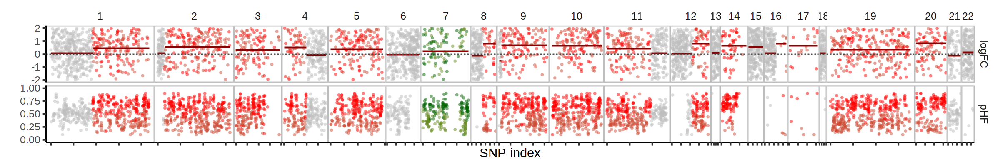

In [141]:
options(repr.plot.width = 12, repr.plot.height = 2, repr.plot.res = 200)

bulk %>% 
plot_psbulk(allele_only = FALSE, min_depth = 10, exp_limit = 2)

In [216]:
yale_meta = fread('~/external/yale/filereport_read_run_PRJNA336283_tsv.txt') %>%
    tidyr::separate_rows(fastq_aspera, sep = ';') %>%
    mutate(sample = sample_title) %>%
    filter(str_detect(fastq_aspera, '_1|_2')) %>%
    mutate(read = ifelse(str_detect(fastq_aspera, '_1.fastq.gz'), 'R1', 'R2')) %>%
    mutate(fastq_rename = glue('{sample}_{read}.fastq.gz')) %>%
    filter(sample != 'MN-63670_TUMOR')

In [217]:
samples = unique(yale_meta$sample)

In [222]:
coldata <- data.frame(
    files = glue("~/external/yale/{samples}/salmon_quant/quant.sf"),
    names=samples, 
    stringsAsFactors=FALSE) %>%
    mutate(condition = "A")

In [223]:
library(tximeta)
se <- tximeta(coldata)

importing quantifications

reading in files with read_tsv

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 
13 
14 
15 
16 
17 
18 


found matching transcriptome:
[ GENCODE - Homo sapiens - release 30 ]

loading existing TxDb created: 2022-05-08 15:45:47

loading existing transcript ranges created: 2022-05-08 15:45:48



In [224]:
gse <- summarizeToGene(se)

loading existing TxDb created: 2022-05-08 15:45:47

obtaining transcript-to-gene mapping from database

loading existing gene ranges created: 2022-05-08 15:48:33

summarizing abundance

summarizing counts

summarizing length



In [271]:
gtex_man = fread('~/GTEx_Analysis_v8_Annotations_SampleAttributesDS.txt') 

In [287]:
gtex_counts = fread('~/GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_reads.gct')

In [288]:
gtex_counts = gtex_counts %>% select(-Name) %>%
    distinct(Description, .keep_all = TRUE) %>%
    tibble::column_to_rownames('Description') %>%
    as.matrix

In [286]:
gtex_counts %>% head

DDX11L1
WASH7P
MIR6859-1
MIR1302-2HG
FAM138A
OR4G4P


In [276]:
select = dplyr::select

In [279]:
brain_annot = gtex_man %>% filter(SMTS %in% c('Brain', 'Blood')) %>% 
    select(cell = SAMPID, cell_type = SMTSD)

In [289]:
ref_brain_gtex = aggregate_counts(
    gtex_counts,
    brain_annot
)$exp_mat

cell_dict
                         Brain - Amygdala 
                                      152 
 Brain - Anterior cingulate cortex (BA24) 
                                      176 
          Brain - Caudate (basal ganglia) 
                                      246 
            Brain - Cerebellar Hemisphere 
                                      215 
                       Brain - Cerebellum 
                                      241 
                           Brain - Cortex 
                                      255 
             Brain - Frontal Cortex (BA9) 
                                      209 
                      Brain - Hippocampus 
                                      197 
                     Brain - Hypothalamus 
                                      202 
Brain - Nucleus accumbens (basal ganglia) 
                                      246 
          Brain - Putamen (basal ganglia) 
                                      205 
       Brain - Spinal cord (cervical c-1) 
 

In [483]:
format_counts = function(counts) {
    rownames(counts) = counts %>% rownames %>% str_split('\\.') %>% purrr::map(1) %>% unlist
    rownames(counts) = gene_dict[rownames(counts)]
    counts = counts[!(is.na(rownames(counts)) | rownames(counts) == ''),,drop=F]
    counts = rowsum(counts, row.names(counts))
    return(counts)
}

counts = round(gse@assays@data$counts) %>% format_counts

In [206]:
df = list()

In [230]:
for (sample in samples) {
    df[[sample]] = fread(glue('~/external/yale/{sample}/{sample}_allele_counts.tsv.gz'))
}

In [523]:
gene_dict %>% saveRDS('~/ref/gene_dict.rds')

In [392]:
R.utils::sourceDirectory('~/numbat/R')

ref_internal = aggregate_counts(
    counts,
    data.frame(
        cell = c('MN-1037_TUMOR', 'MN-1076_TUMOR'),
        group = 'Ref'
    )
)

cell_dict
Ref 
  2 


In [509]:
ref_internal = gene_counts[,'MN-1037_TUMOR',drop=F]/sum(gene_counts[,'MN-1037_TUMOR'])

In [336]:
library(logger)
library(patchwork)
library(ggplot2)

In [414]:
sample = 'MN-5_TUMOR'

In [510]:
R.utils::sourceDirectory('~/numbat/R')

bulk = get_bulk(
    count_mat = counts[,sample,drop=FALSE],
    df_allele = df[[sample]],
    lambdas_ref = ref_internal,
    genetic_map = genetic_map_hg38,
    gtf = gtf_hg38
)

number of genes left: 11792



In [332]:
R.utils::sourceDirectory('~/numbat/R')

bulks = mclapply(
    mc.cores = length(samples),
    samples,
    function(sample) {
        bulk = get_bulk(
            count_mat = counts[,sample,drop=FALSE],
            df_allele = df[[sample]],
            lambdas_ref = ref_internal,
            genetic_map = genetic_map_hg38,
            gtf = gtf_hg38
        ) %>% analyze_bulk(bal_cnv = FALSE) %>%
        mutate(sample = UQ(sample))
    }) %>%
    bind_rows()

In [382]:
for (sample in samples) {
    saveRDS(counts[,sample,drop=F], glue('~/external/yale/{sample}/{sample}_gene_counts.rds'))
}

In [514]:
saveRDS(counts, '~/external/yale/gene_counts.rds')

In [357]:
bulks %>% filter(sample == 'MN-5_TUMOR') %>% 
filter(cnv_state != 'neu') %>%
distinct(seg, LLR, LLR_x, LLR_y, theta_mle) %>%
arrange(LLR)

seg,theta_mle,LLR_x,LLR_y,LLR
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
8b,0.07914223,0.2156451,42.84497,43.06061
5a,0.08565746,3.8721009,40.24134,44.11344
17a,0.09670731,9.0395141,50.92357,59.96308
19a,0.20357192,56.6986619,172.97814,229.67680
22a,0.16048159,76.8765296,153.41808,230.29461
1a,0.10641435,112.3767933,364.05816,476.43495
6b,0.10691268,19.6456719,461.38131,481.02698
17c,0.21450446,41.8123569,616.59730,658.40965


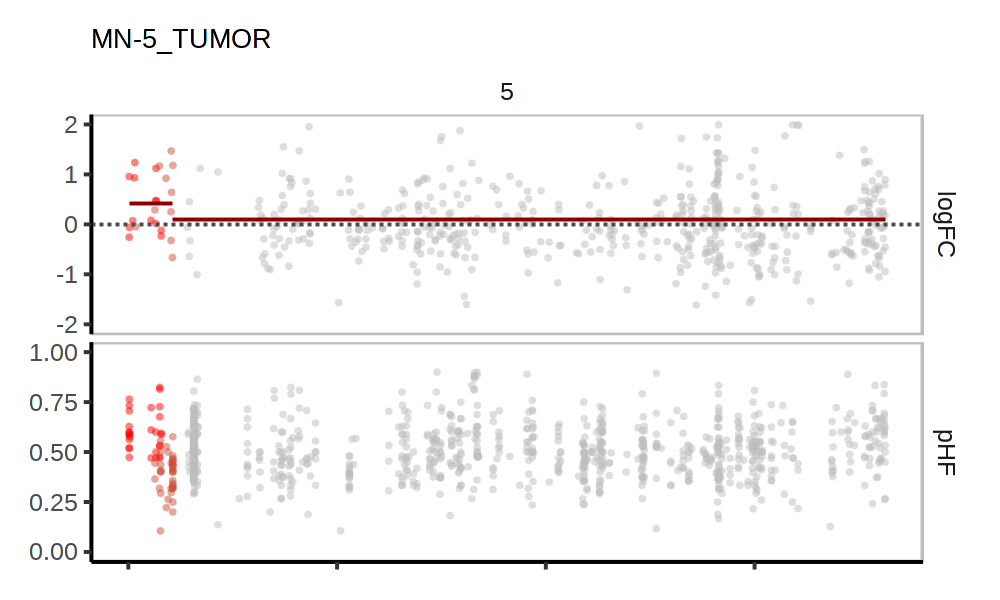

In [367]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
R.utils::sourceDirectory('~/numbat/R')

bulks %>% 
filter(sample == 'MN-5_TUMOR') %>%
filter(CHROM == 5) %>%
plot_bulks(min_depth = 15, use_pos = TRUE)

In [ ]:
sweep(m,2,colSums(m),`/`)

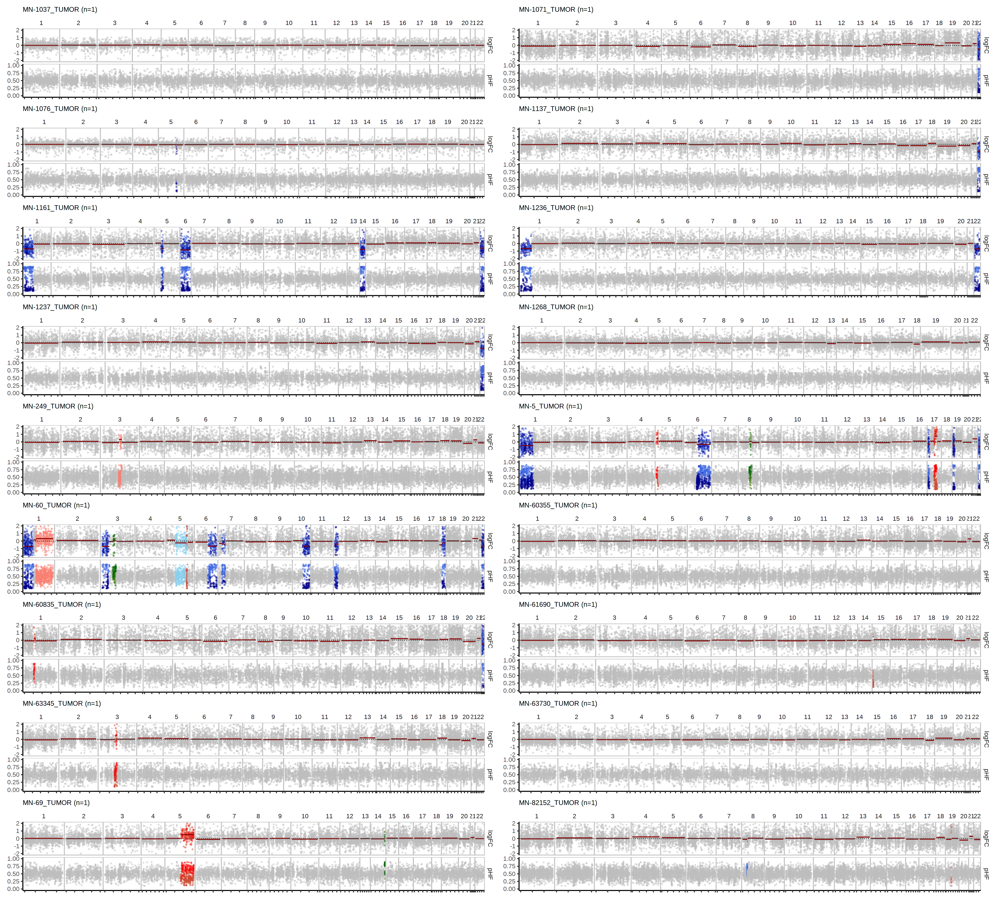

In [337]:
options(repr.plot.width = 20, repr.plot.height = 18, repr.plot.res = 200)

bulks %>%
mutate(n_cells = 1) %>%
plot_bulks(min_depth = 15, exp_limit = 2, ncol = 2, use_pos = FALSE)

In [5]:
library(Rsamtools)

Loading required package: GenomeInfoDb

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    union, unique, unsplit, which.max, which.min


Loading required package: S4Vectors

Loading required package: stats4


Att

In [9]:
bam <- scanBam("~/external/multiome/lymph_node_lymphoma_14k_atac_possorted_bam.bam",
               param = ScanBamParam(tag = c('CB'),  what = c("pos")))